Convolution and Filtering

In [1]:
from imageio.v3 import imread
import IPython
import numpy as np
from scipy.io import wavfile
from scipy.signal import fftconvolve
from scipy.fftpack import fft, ifft, fft2, ifft2
from matplotlib import pyplot as plt
import time

In [2]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12, 3)      # Change plot size / aspect (you may adjust this).

In [3]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        # Copy your code from The Discrete Fourier Transform lab here
        self.rate = rate
        self.samples = samples

    def plot(self, boolean = False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        # Copy your code from The Discrete Fourier Transform lab here
        if boolean:
            n = len(self.samples)
            k = np.arange(n)

            # Convert frequencies to Hertz
            freqs = k * self.rate / n

            # Obtain magnitudes
            spectrum = np.abs(fft(self.samples))  

            # Assure only the first half will be plotted
            half_n = n // 2
            freqs = freqs[:half_n]
            spectrum = spectrum[:half_n]

            # Assue that zero-magnitude frequencies are not plotted
            mask = spectrum > 0
            freqs = freqs[mask]
            spectrum = spectrum[mask]
        
            # Plot the DFT's
            plt.plot(freqs, spectrum)
            plt.xlabel("Present Frequencies")
            plt.ylabel("Magnitude")
            plt.title("SoundWave: Frequency Domain")

            plt.ylim(bottom=np.min(spectrum) * 0.9) # exlude magnitude 0 frequencies in plot

            plt.tight_layout()
            plt.show()

        else:
            # Calulate length of sound wave in seconds
            length = len(self.samples) / self.rate

            # Create time array for plotting
            time = np.linspace(0, length, len(self.samples))

            # Plot the stored soundwave
            plt.plot(time, self.samples)
            plt.xlabel(f"Time in seconds")
            plt.ylabel("Amplitude")
            plt.ylim(-32768, 32767)
            plt.title("Sound wave")
            plt.tight_layout()
            plt.show()

    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        # Copy your code from The Discrete Fourier Transform lab here
        # Scale the samples using the given equation if the array of samples does not have np.int16 as its data type or if false is Flase
        if self.samples.dtype != np.int16 or force:
            scaled_samples = np.int16(self.samples / np.max(np.abs(self.samples)) * 32767)
        else:
            scaled_samples = self.samples               # Keep the original samples 

        # Write to the specified file
        wavfile.write(filename, self.rate, scaled_samples)
    
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        # Copy your code from The Discrete Fourier Transform lab here
        # Raise ValueError if sample arrays from A and B are not same length
        if len(self.samples) != len(other.samples):
            raise ValueError("Samples arrays from A and B are not same length")

        # Convert to floating point for mixing to prevent clipping
        float_samples1 = self.samples.astype(np.float32) / 32767.0
        float_samples2 = other.samples.astype(np.float32) / 32767.0
        
        # Mix the samples (average) to prevent distortion
        samples_combined = (float_samples1 + float_samples2) / 2
        
        # Scale back to int16 range and clip
        samples_combined = np.int16(samples_combined * 32767)

        return SoundWave(self.rate, samples_combined)

    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        # Copy your code from The Discrete Fourier Transform lab here
        # Raise ValueError if the samples rates from the two objects are not equal
        if self.rate != other.rate:
            raise ValueError("Samples rates from the two objects are not equal")
        
        # Concenate samples
        concatenated_samples = np.concatenate((self.samples, other.samples))
        
        return SoundWave(self.rate, concatenated_samples)

    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        # Raise ValueError if the the two sample rates are not equal
        if int(self.rate) != int(other.rate):
            raise ValueError("Sample rates must be equal")

        # Append 0's to shorter array if needed
        if len(self.samples) != len(other.samples):
            max_length = max(len(self.samples), len(other.samples))
            
            A_padded = np.pad(self.samples, (0, max_length - len(self.samples)), mode='constant')
            B_padded = np.pad(other.samples, (0, max_length - len(other.samples)), mode = 'constant')

        # Use the FFT on our padded samples
        A_fft = fft(A_padded)
        B_fft = fft(B_padded)

        # Compute the convolution
        A_B_convolution = np.real(ifft(A_fft * B_fft))

        return SoundWave(self.rate, A_B_convolution)

    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        # Raise ValueError if sample rates are not equal
        if self.rate != other.rate:
            raise ValueError("Sample rates are not equal")
        
        # Obtain length of samples
        m = len(other.samples)
        n = len(self.samples)
        
        # Compute the smallest 2^a such that 2^a > n + m - 1
        smallest_2a = 2**np.ceil(np.log2(n + m - 1)).astype(int)

        # Append 0's to each sample so that they have 2^a entries
        A_padded = np.pad(self.samples, (0, smallest_2a - n), mode='constant')
        B_padded = np.pad(other.samples, (0, smallest_2a - m), mode = "constant")

        # Use the FFT on out padded samples
        A_fft = fft(A_padded)
        B_fft = fft(B_padded)

        # Compute the convolution, then use the inverse FFT to get the samples
        A_B_convolution = np.real(ifft(A_fft * B_fft))

        return SoundWave(self.rate, A_B_convolution[:n + m - 1])       #  Use only the first n + m − 1 entries of this convolution
        
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        # Compute the integer indeces corresponding to vlow and vhigh
        n = len(self.samples)
        k_low = int(np.floor(low_freq * n / self.rate))
        k_high = int(np.floor(high_freq * n / self.rate))

        # Compute the DFT's
        range = fft(self.samples)
    
        # Zero out the frequencies in the range
        range[k_low: k_high] = 0
        range[-k_high: -k_low] = 0

        # Take the IDFT of the altered array
        cleaned = np.real(ifft(range))

        self.samples = np.int64(cleaned)

In [4]:
# Generate two seconds of white noise
rate = 22050 
white_noise = np.random.randint(-32767, 32767, rate*2, dtype= np.int16)
white_wave = SoundWave(rate, white_noise)
white_wave.export("white_noise.wav")
IPython.display.Audio('white_noise.wav')


In [5]:
# Convolve tada wave with white noise
rate, samples = wavfile.read("tada.wav")
tada_wav = SoundWave(rate, samples)
convolved = tada_wav * white_wave

# Append convolve to itself
temp = convolved >> convolved
temp.export('Convolved_wave.wav')
IPython.display.Audio('Convolved_wave.wav')


In [6]:
# Time the linear convolution of CCG.wav and GCG.wav
CGCrate, CGCsamples = wavfile.read("CGC.wav")
GCGrate, GCGsamples = wavfile.read("GCG.wav")

CGC_wave = SoundWave(CGCrate, CGCsamples)
GCG_wave = SoundWave(GCGrate, GCGsamples)

# Time my __pow__ method
start = time.time()
my_convolve = CGC_wave ** GCG_wave
my_convolve_time = time.time() - start

# Time the scipy method
start = time.time()
scipy_convolve_samples = fftconvolve(CGCsamples, GCGsamples, mode = "full")
scipy_convolve_time = time.time() - start


# Compare results
print(f"Time to convolute signals using __pow__ magic method: {my_convolve_time}")
print(f"Time to convolute signals using scipy fftconvolve: {scipy_convolve_time}")

Time to convolute signals using __pow__ magic method: 0.038108110427856445
Time to convolute signals using scipy fftconvolve: 0.01394510269165039


In [7]:
# Original sound of CGC
CGC_wave.export("CGC_original_sound.wav")
IPython.display.Audio('CGC_original_sound.wav')


In [6]:
# Original sound of GCG
GCG_wave.export("GCG_original_sound.wav")
IPython.display.Audio("GCG_original_sound.wav")


In [8]:
# Sound of CGC and GCG convolved using __pow__ magic method
my_convolve.export("__pow__convolve_of_CGC_and_GCG.wav")
IPython.display.Audio("__pow__convolve_of_CGC_and_GCG.wav")

In [9]:
# Sound of CGC and GCG convolved using scipy method
scipy_convolve_wave = SoundWave(CGCrate, scipy_convolve_samples)
scipy_convolve_wave.export("scipy_convolve_of_CGC_and_GCG.wav")
IPython.display.Audio("scipy_convolve_of_CGC_and_GCG.wav")

In [50]:
# Compute the linear convolution of chopin.wav and balloon.wav
chopin_rate, chopin_samples = wavfile.read('chopin.wav')
balloon_rate, balloon_samples = wavfile.read('balloon.wav')

chopin_wave = SoundWave(chopin_rate, chopin_samples)
balloon_wave = SoundWave(balloon_rate, balloon_samples)

convolved = chopin_wave ** balloon_wave

#Produce the original chopin sound
chopin_wave.export("chopin_sound.wav")
IPython.display.Audio("chopin_sound.wav")

In [51]:
# Produce the original balloon sound
balloon_wave.export('balloon_sound.wav')
IPython.display.Audio("balloon_sound.wav")

In [52]:
# Produce the convolution
convolved.export("chopin_balloon_convolve.wav")
IPython.display.Audio("chopin_balloon_convolve.wav")

In [8]:
# Obtain original noisy 1 audio
noisy1_rate, noisy1_samples = wavfile.read("noisy1.wav")
noisy1_wave = SoundWave(noisy1_rate, noisy1_samples)
noisy1_wave.export("Original_noisy1.wav")
IPython.display.Audio("Original_noisy1.wav")

In [9]:
# Clean noisy1 and display cleaned audio
noisy1_wave.clean(1250, 2600)
noisy1_wave.export("Cleaned_noisy1.wav")
IPython.display.Audio("CLeaned_noisy1.wav")

In [10]:
# Obtain original noise2 audio
noisy2_rate, noisy2_samples = wavfile.read("noisy2.wav")
noisy2_wave = SoundWave(noisy2_rate, noisy2_samples)

noisy2_wave.export("original_noisy2.wav")
IPython.display.Audio("original_noisy2.wav")


In [20]:
#Clean noisy2 and display cleaned audio
noisy2_wave.clean(1300, 4500)

noisy2_wave.export("cleaned_noisy2.wav")
IPython.display.Audio("cleaned_noisy2.wav")
# noisy2_wave.plot(True)

In [12]:
"""- Embed the orignal file in the first cell.
- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the last cell. """

# Produce original audio
vuvu_rate, vuvu_samples = wavfile.read("vuvuzela.wav")
vuvu_together = SoundWave(vuvu_rate, vuvu_samples)

vuvu_together.export("original_vuvuzela_sound.wav")
IPython.display.Audio("original_vuvuzela_sound.wav")

In [14]:
# Seperate into two channels and clean each
first_channel = SoundWave(vuvu_rate, vuvu_samples[:, 0])
second_channel = SoundWave(vuvu_rate, vuvu_samples[:, 1])
first_channel.clean(200, 500)
second_channel.clean(200, 500)

# Combine channels and play clean audio
combined_channels = np.column_stack((first_channel.samples, second_channel.samples))
cleaned_sound = SoundWave(vuvu_rate, combined_channels)
cleaned_sound.export("cleaned_vuvuzela_sound.wav")
IPython.display.Audio("cleaned_vuvuzela_sound.wav")

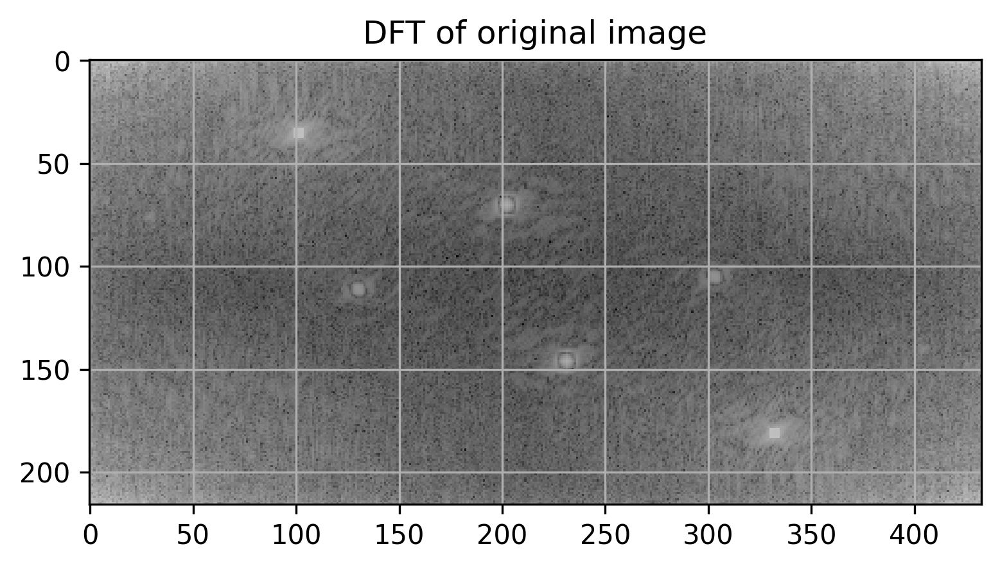

In [61]:
"""- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images side by side in subplots.
- In the markdown cell, indicate the year on the sticker. """

# Read in image
image = imread("license_plate.png")
im_dft = fft2(image)

# Plot original DFT to see spikes
plt.imshow(np.log(np.abs(im_dft)), cmap="gray")
plt.title("DFT of original image")
plt.grid()
plt.show()

# Create copy of DFT be cleaned at bright spikes
im_dft_clean = im_dft.copy()

# Obtain mean values of image in general to replace spikes with
im_mean = np.mean(im_dft)

# Construct new DFT matrix
bright_spots = [(40, 100), (110, 130), (65, 200), (146, 230), (103, 303), (170, 330)]
patch_size = 25
for row, column in bright_spots:
    im_dft_clean[row - patch_size:row + patch_size + 1, column - patch_size:column + patch_size + 1] = im_mean

# Perform inverse DFT to get back to cleaned image
clean_image = np.real(ifft2(im_dft_clean))

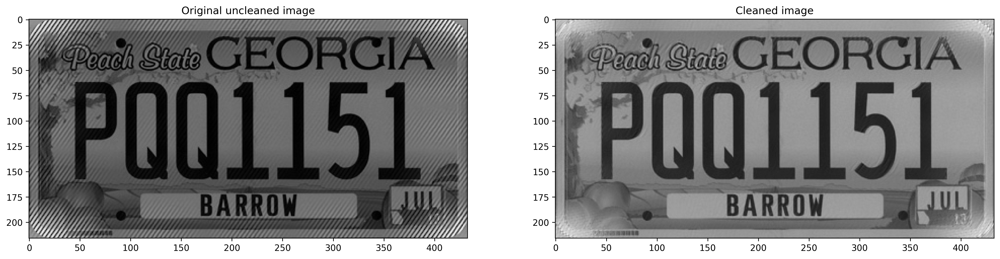

In [62]:
# Display Original image and cleaned image side by side
plt.figure(figsize=(20, 8))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap = "gray")
plt.title("Original uncleaned image")

plt.subplot(1, 2, 2)
plt.imshow(clean_image, cmap = "gray")
plt.title("Cleaned image")
plt.show()

The year on the sticker is ... 13